In [1]:
import numpy as np
import cupy as cp
import astropy.units as u
from astropy.io import fits
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output
from importlib import reload

import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('INFO')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)

poppy_log.disabled = True

import warnings
warnings.filterwarnings("ignore")

import cgi_phasec_poppy as cgi
from cgi_phasec_poppy import misc

from wfsc import iefc_2dm as iefc
from wfsc import utils

INFO:numexpr.utils:Note: NumExpr detected 24 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:numexpr.utils:NumExpr defaulting to 8 threads.


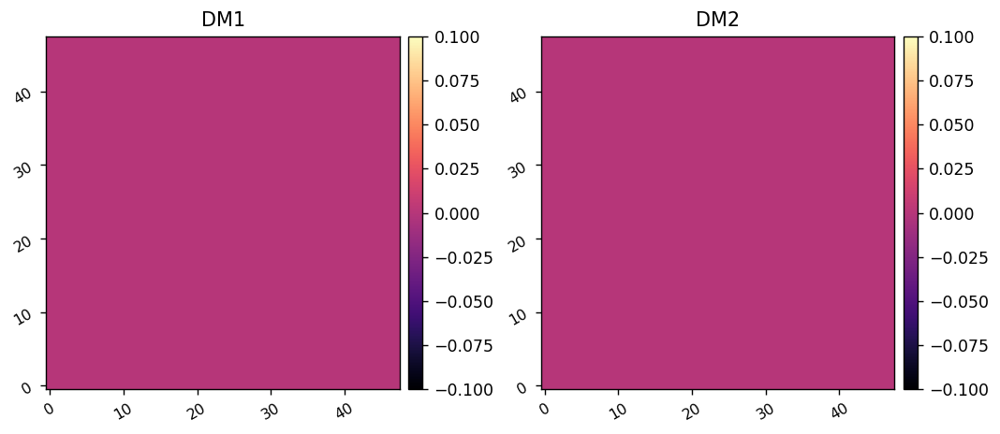

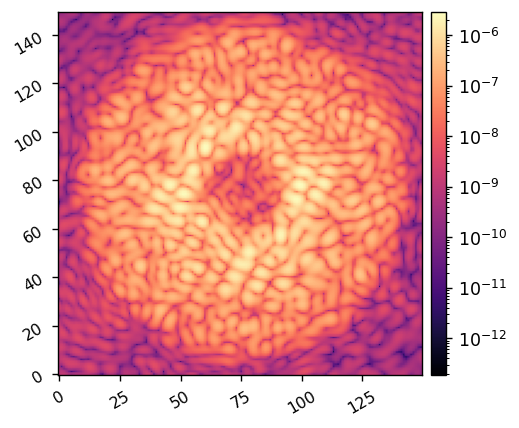

In [2]:
reload(cgi)
sysi = cgi.CGI(cgi_mode='spc-wide', npsf=150,
              use_fpm=True,
              use_pupil_defocus=True, 
              polaxis=0,
              use_opds=True,
             )
sysi.show_dms()

npsf = sysi.npsf
Nact = sysi.Nact

ref_psf = sysi.snap()

misc.myimshow(ref_psf, lognorm=True)

# Create dark hole ROI to calibrate and control

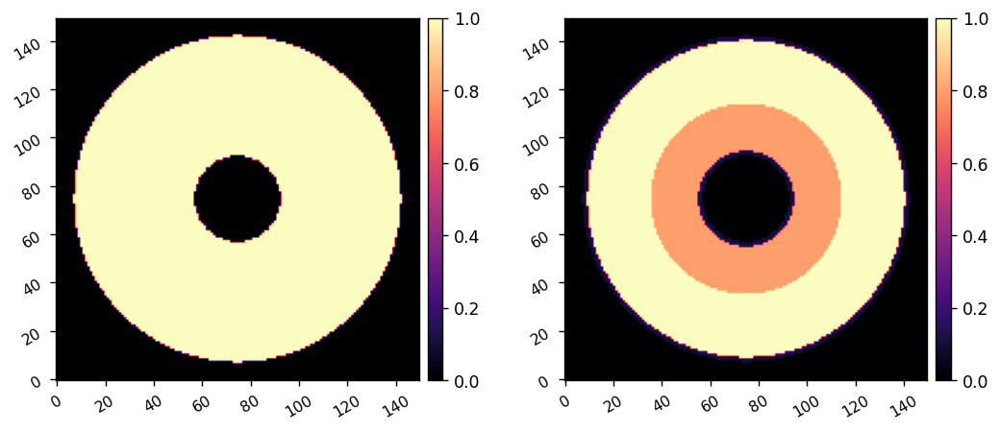

In [3]:
reload(utils)
xfp = np.linspace(-0.5, 0.5, npsf) * npsf * sysi.psf_pixelscale_lamD
fpx,fpy = np.meshgrid(xfp,xfp)
fpr = np.sqrt(fpx**2 + fpy**2)

# Create the mask that is used to select which region to make dark.
iwa = 5.4
owa = 20.6
regions = [iwa, 6, 12, 20, owa]
weights = [0.1, 0.8, 1, 0.1]
weight_map = np.zeros((sysi.npsf,sysi.npsf), dtype=np.float64)
for i in range(len(weights)):
    roi_params = {
        'inner_radius' : regions[i],
        'outer_radius' : regions[i+1],
        'edge_position' : 0,
        'rotation':0,
        'full':True,
    }
    roi = utils.create_annular_focal_plane_mask(fpx, fpy, roi_params)
    weight_map += roi*weights[i]

control_mask = weight_map>0

misc.myimshow2(control_mask, weight_map)

# Create probe and fourier modes

(1252, 2304) (626, 2)


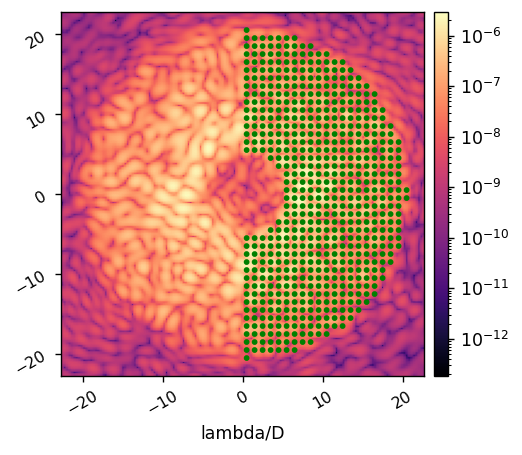

In [4]:
reload(utils)
calib_modes, fs = utils.select_fourier_modes(sysi, control_mask*(fpx>0), fourier_sampling=1) 
nmodes = calib_modes.shape[0]
print(calib_modes.shape, fs.shape)

patches = []
for f in fs:
    center = (f[0], f[1])
    radius = 0.25
    patches.append(Circle(center, radius, fill=True, color='g'))
    
misc.myimshow(ref_psf, lognorm=True, pxscl=sysi.psf_pixelscale_lamD, patches=patches)

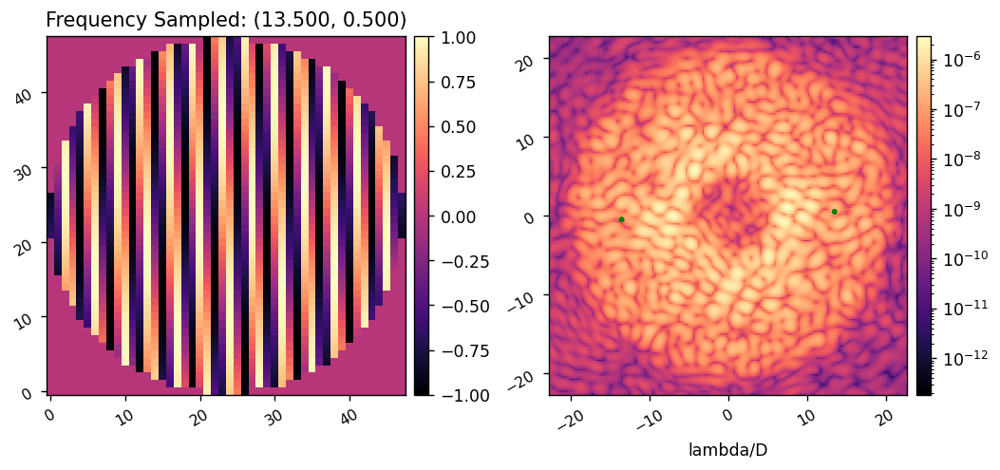

In [5]:
import time
for i in range(calib_modes.shape[0]//4, calib_modes.shape[0]//2):
    try:
        misc.myimshow2(calib_modes[i].reshape(Nact,Nact), ref_psf, 
                       'Frequency Sampled: ({:.3f}, {:.3f})'.format(fs[i][0], fs[i][1]),
                       lognorm2=True,
                       pxscl2=sysi.psf_pixelscale_lamD, 
                       patches2=[Circle(fs[i], 0.25, fill=True, color='g'),
                                 Circle(-fs[i], 0.25, fill=True, color='g')])
        clear_output(wait=True)
        time.sleep(0.25)
    except KeyboardInterrupt:
        break

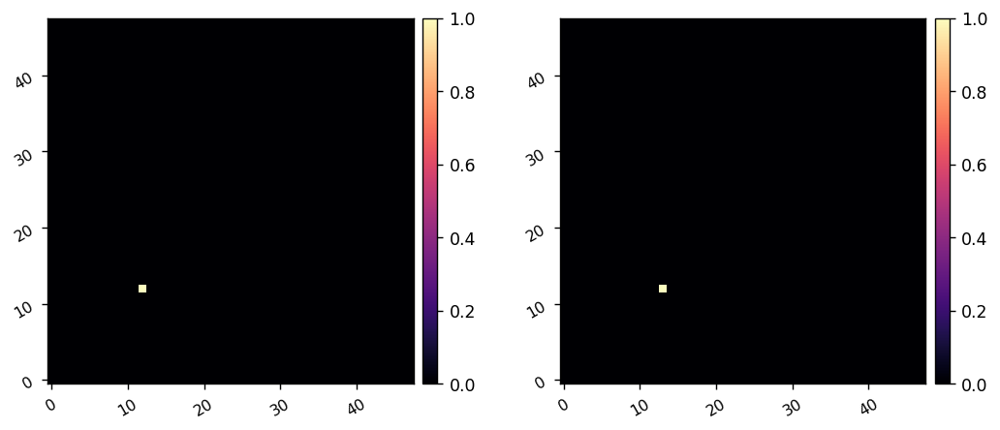

In [6]:
reload(iefc)
probe_modes = utils.create_probe_poke_modes(Nact, xinds=[Nact//4, Nact//4+1], yinds=[Nact//4, Nact//4], display=True)
# probe_modes = utils.create_fourier_probes(calib_modes, display_probes=True)

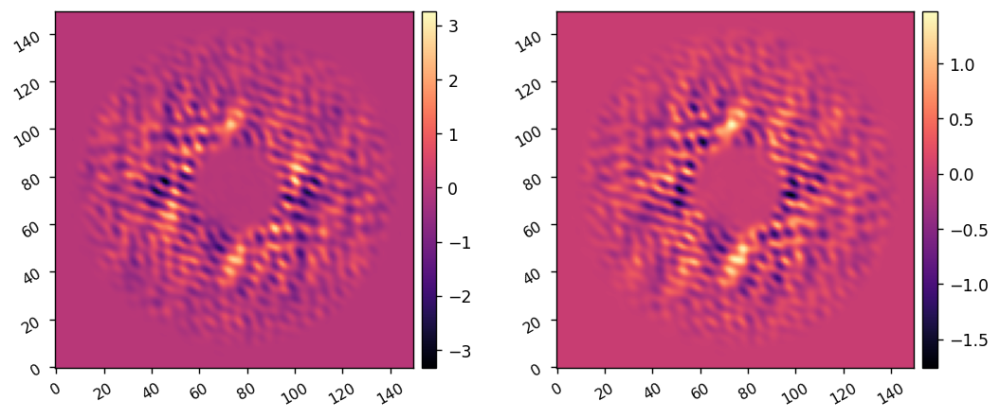

In [7]:
reload(iefc)

probe_amp = 3e-8
calib_amp = 5e-9

sysi.reset_dms()
differential_images, single_images = iefc.take_measurement(sysi, 
                                                           probe_modes, probe_amp, 
                                                           return_all=True, display=True)

# Calibrate IEFC (or load in previous calibration data)

In [8]:
reload(iefc)
response_cube, calibration_cube = iefc.calibrate(sysi, 
                                                 probe_amp, probe_modes, 
                                                 calib_amp, calib_modes, start_mode=0)

Calibrating I-EFC...
	Calibrated mode 1 / 1252 in 13.012s
	Calibrated mode 2 / 1252 in 25.933s
	Calibrated mode 3 / 1252 in 39.098s
	Calibrated mode 4 / 1252 in 52.289s
	Calibrated mode 5 / 1252 in 65.843s
	Calibrated mode 6 / 1252 in 79.129s
	Calibrated mode 7 / 1252 in 92.102s
	Calibrated mode 8 / 1252 in 105.049s
	Calibrated mode 9 / 1252 in 117.955s
	Calibrated mode 10 / 1252 in 133.182s
	Calibrated mode 11 / 1252 in 148.989s
	Calibrated mode 12 / 1252 in 164.799s
	Calibrated mode 13 / 1252 in 180.610s
	Calibrated mode 14 / 1252 in 196.173s
	Calibrated mode 15 / 1252 in 211.032s
	Calibrated mode 16 / 1252 in 225.513s
	Calibrated mode 17 / 1252 in 238.600s
	Calibrated mode 18 / 1252 in 251.460s
	Calibrated mode 19 / 1252 in 264.311s
	Calibrated mode 20 / 1252 in 277.449s
	Calibrated mode 21 / 1252 in 290.408s
	Calibrated mode 22 / 1252 in 303.397s
	Calibrated mode 23 / 1252 in 316.285s
	Calibrated mode 24 / 1252 in 329.539s
	Calibrated mode 25 / 1252 in 342.709s
	Calibrated mode 26 

	Calibrated mode 205 / 1252 in 2731.729s
	Calibrated mode 206 / 1252 in 2747.425s
	Calibrated mode 207 / 1252 in 2760.930s
	Calibrated mode 208 / 1252 in 2775.750s
	Calibrated mode 209 / 1252 in 2791.425s
	Calibrated mode 210 / 1252 in 2805.476s
	Calibrated mode 211 / 1252 in 2820.581s
	Calibrated mode 212 / 1252 in 2835.853s
	Calibrated mode 213 / 1252 in 2849.704s
	Calibrated mode 214 / 1252 in 2864.044s
	Calibrated mode 215 / 1252 in 2877.130s
	Calibrated mode 216 / 1252 in 2890.156s
	Calibrated mode 217 / 1252 in 2903.174s
	Calibrated mode 218 / 1252 in 2916.201s
	Calibrated mode 219 / 1252 in 2930.244s
	Calibrated mode 220 / 1252 in 2946.257s
	Calibrated mode 221 / 1252 in 2961.473s
	Calibrated mode 222 / 1252 in 2978.926s
	Calibrated mode 223 / 1252 in 2996.400s
	Calibrated mode 224 / 1252 in 3013.415s
	Calibrated mode 225 / 1252 in 3026.432s
	Calibrated mode 226 / 1252 in 3039.449s
	Calibrated mode 227 / 1252 in 3052.461s
	Calibrated mode 228 / 1252 in 3065.486s
	Calibrated mode

	Calibrated mode 405 / 1252 in 5380.104s
	Calibrated mode 406 / 1252 in 5392.980s
	Calibrated mode 407 / 1252 in 5405.860s
	Calibrated mode 408 / 1252 in 5419.251s
	Calibrated mode 409 / 1252 in 5432.436s
	Calibrated mode 410 / 1252 in 5445.706s
	Calibrated mode 411 / 1252 in 5458.666s
	Calibrated mode 412 / 1252 in 5471.565s
	Calibrated mode 413 / 1252 in 5484.508s
	Calibrated mode 414 / 1252 in 5498.302s
	Calibrated mode 415 / 1252 in 5512.077s
	Calibrated mode 416 / 1252 in 5525.400s
	Calibrated mode 417 / 1252 in 5539.360s
	Calibrated mode 418 / 1252 in 5552.730s
	Calibrated mode 419 / 1252 in 5565.699s
	Calibrated mode 420 / 1252 in 5578.645s
	Calibrated mode 421 / 1252 in 5591.682s
	Calibrated mode 422 / 1252 in 5605.574s
	Calibrated mode 423 / 1252 in 5618.823s
	Calibrated mode 424 / 1252 in 5632.118s
	Calibrated mode 425 / 1252 in 5645.171s
	Calibrated mode 426 / 1252 in 5658.336s
	Calibrated mode 427 / 1252 in 5671.739s
	Calibrated mode 428 / 1252 in 5684.912s
	Calibrated mode

	Calibrated mode 605 / 1252 in 8025.481s
	Calibrated mode 606 / 1252 in 8038.349s
	Calibrated mode 607 / 1252 in 8051.218s
	Calibrated mode 608 / 1252 in 8064.084s
	Calibrated mode 609 / 1252 in 8076.952s
	Calibrated mode 610 / 1252 in 8089.821s
	Calibrated mode 611 / 1252 in 8102.718s
	Calibrated mode 612 / 1252 in 8115.582s
	Calibrated mode 613 / 1252 in 8128.444s
	Calibrated mode 614 / 1252 in 8141.304s
	Calibrated mode 615 / 1252 in 8154.180s
	Calibrated mode 616 / 1252 in 8167.038s
	Calibrated mode 617 / 1252 in 8179.900s
	Calibrated mode 618 / 1252 in 8192.792s
	Calibrated mode 619 / 1252 in 8205.649s
	Calibrated mode 620 / 1252 in 8218.523s
	Calibrated mode 621 / 1252 in 8231.384s
	Calibrated mode 622 / 1252 in 8244.242s
	Calibrated mode 623 / 1252 in 8257.105s
	Calibrated mode 624 / 1252 in 8269.972s
	Calibrated mode 625 / 1252 in 8282.859s
	Calibrated mode 626 / 1252 in 8295.747s
	Calibrated mode 627 / 1252 in 8308.607s
	Calibrated mode 628 / 1252 in 8321.467s
	Calibrated mode

	Calibrated mode 804 / 1252 in 10587.669s
	Calibrated mode 805 / 1252 in 10600.555s
	Calibrated mode 806 / 1252 in 10613.416s
	Calibrated mode 807 / 1252 in 10626.286s
	Calibrated mode 808 / 1252 in 10639.150s
	Calibrated mode 809 / 1252 in 10652.026s
	Calibrated mode 810 / 1252 in 10664.892s
	Calibrated mode 811 / 1252 in 10677.748s
	Calibrated mode 812 / 1252 in 10690.686s
	Calibrated mode 813 / 1252 in 10703.544s
	Calibrated mode 814 / 1252 in 10716.428s
	Calibrated mode 815 / 1252 in 10729.298s
	Calibrated mode 816 / 1252 in 10742.167s
	Calibrated mode 817 / 1252 in 10755.027s
	Calibrated mode 818 / 1252 in 10767.892s
	Calibrated mode 819 / 1252 in 10780.768s
	Calibrated mode 820 / 1252 in 10793.688s
	Calibrated mode 821 / 1252 in 10806.553s
	Calibrated mode 822 / 1252 in 10819.420s
	Calibrated mode 823 / 1252 in 10832.281s
	Calibrated mode 824 / 1252 in 10845.150s
	Calibrated mode 825 / 1252 in 10858.018s
	Calibrated mode 826 / 1252 in 10870.890s
	Calibrated mode 827 / 1252 in 108

	Calibrated mode 1000 / 1252 in 13111.555s
	Calibrated mode 1001 / 1252 in 13124.430s
	Calibrated mode 1002 / 1252 in 13137.303s
	Calibrated mode 1003 / 1252 in 13150.185s
	Calibrated mode 1004 / 1252 in 13163.069s
	Calibrated mode 1005 / 1252 in 13175.945s
	Calibrated mode 1006 / 1252 in 13188.869s
	Calibrated mode 1007 / 1252 in 13201.740s
	Calibrated mode 1008 / 1252 in 13214.613s
	Calibrated mode 1009 / 1252 in 13227.516s
	Calibrated mode 1010 / 1252 in 13240.394s
	Calibrated mode 1011 / 1252 in 13253.275s
	Calibrated mode 1012 / 1252 in 13266.156s
	Calibrated mode 1013 / 1252 in 13279.036s
	Calibrated mode 1014 / 1252 in 13291.922s
	Calibrated mode 1015 / 1252 in 13304.796s
	Calibrated mode 1016 / 1252 in 13317.674s
	Calibrated mode 1017 / 1252 in 13330.552s
	Calibrated mode 1018 / 1252 in 13343.421s
	Calibrated mode 1019 / 1252 in 13356.311s
	Calibrated mode 1020 / 1252 in 13369.182s
	Calibrated mode 1021 / 1252 in 13382.082s
	Calibrated mode 1022 / 1252 in 13394.951s
	Calibrated

	Calibrated mode 1191 / 1252 in 15572.684s
	Calibrated mode 1192 / 1252 in 15585.570s
	Calibrated mode 1193 / 1252 in 15598.511s
	Calibrated mode 1194 / 1252 in 15611.393s
	Calibrated mode 1195 / 1252 in 15624.281s
	Calibrated mode 1196 / 1252 in 15637.457s
	Calibrated mode 1197 / 1252 in 15650.517s
	Calibrated mode 1198 / 1252 in 15663.924s
	Calibrated mode 1199 / 1252 in 15677.153s
	Calibrated mode 1200 / 1252 in 15690.545s
	Calibrated mode 1201 / 1252 in 15703.675s
	Calibrated mode 1202 / 1252 in 15717.455s
	Calibrated mode 1203 / 1252 in 15731.063s
	Calibrated mode 1204 / 1252 in 15744.843s
	Calibrated mode 1205 / 1252 in 15757.939s
	Calibrated mode 1206 / 1252 in 15771.025s
	Calibrated mode 1207 / 1252 in 15784.109s
	Calibrated mode 1208 / 1252 in 15797.239s
	Calibrated mode 1209 / 1252 in 15810.325s
	Calibrated mode 1210 / 1252 in 15823.405s
	Calibrated mode 1211 / 1252 in 15836.495s
	Calibrated mode 1212 / 1252 in 15849.587s
	Calibrated mode 1213 / 1252 in 15862.698s
	Calibrated

In [9]:
fname = 'spc_wide_2dm_annular_6to20.pkl'
# iefc_dir = Path('/groups/douglase/kians-data-files/roman-cgi-iefc-data')
iefc_dir = Path('C:/Users/Kian/Documents/data-files/roman-cgi-iefc-data')

In [10]:
misc.save_pickle(iefc_dir/'response-data'/fname, response_cube)
misc.save_pickle(iefc_dir/'calibration-data'/fname, calibration_cube)

Saved data to:  C:\Users\Kian\Documents\data-files\roman-cgi-iefc-data\response-data\spc_wide_2dm_annular_6to20.pkl
Saved data to:  C:\Users\Kian\Documents\data-files\roman-cgi-iefc-data\calibration-data\spc_wide_2dm_annular_6to20.pkl


In [16]:
response_cube = misc.load_pickle(iefc_dir/'response-data'/fname)
# calibration_cube = misc.load_pickle(iefc_dir/'calibration-data'/fname)

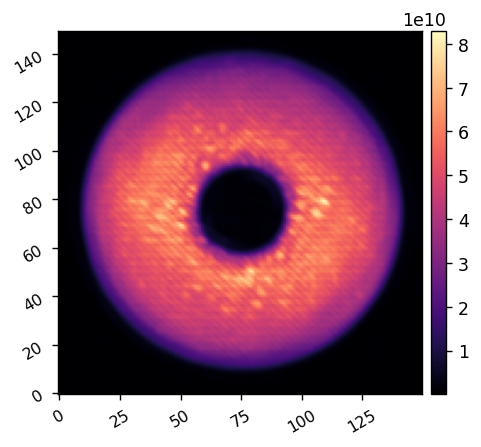

In [11]:
response_sum = np.sum(abs(response_cube), axis=(0,1))
misc.myimshow(response_sum.reshape(sysi.npsf,sysi.npsf))

# Create control matrix

In [18]:
reg_fun = iefc.construct_control_matrix
reg_conds = [[0, 15, 30],
             [(1e-1, 1e-1), (1e-2, 1e-2), (1e-3, 1e-3)]]
reg_conds = [[0],
             [(1e-1, 1e-1)]]
reg_conds = [[0, 15, 20, 30, 35,],
             [(1e-1, 1e-1), (1e-2, 1e-2), (1e-1, 1e-1), (1e-2, 1e-2), (1e-1, 1e-1)]]

# Run IEFC

In [12]:
response_cube.shape

(2504, 2, 22500)

In [14]:
response_cube

control_matrix = iefc.construct_control_matrix(response_cube, 
                         weight_map.flatten(), 
                         rcond1=1e-2, 
                         rcond2=1e-2, 
                         nprobes=probe_modes.shape[0], pca_modes=None)

Using Weighted Least Squares 


In [16]:
control_matrix.shape

(2504, 26664)

Running I-EFC...
	Closed-loop iteration 1 / 50
	Computing EFC matrix via construct_control_matrix with condition values (0.1, 0.1)
Using Weighted Least Squares 
(2504,)


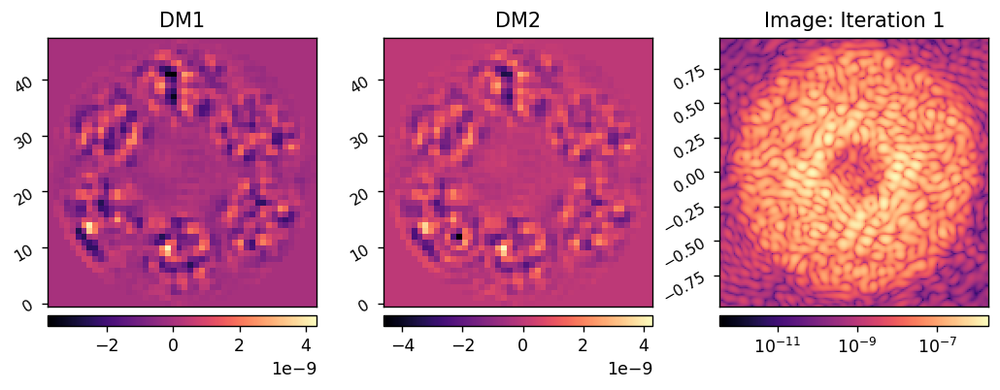

	Closed-loop iteration 2 / 50
(2504,)


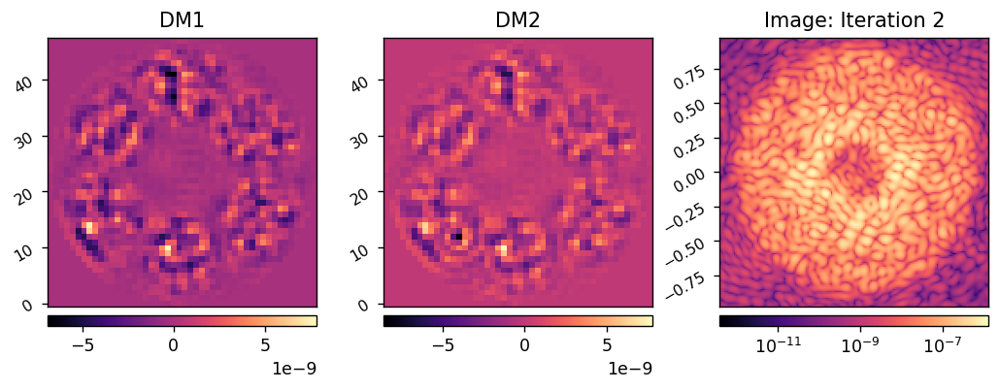

	Closed-loop iteration 3 / 50
(2504,)


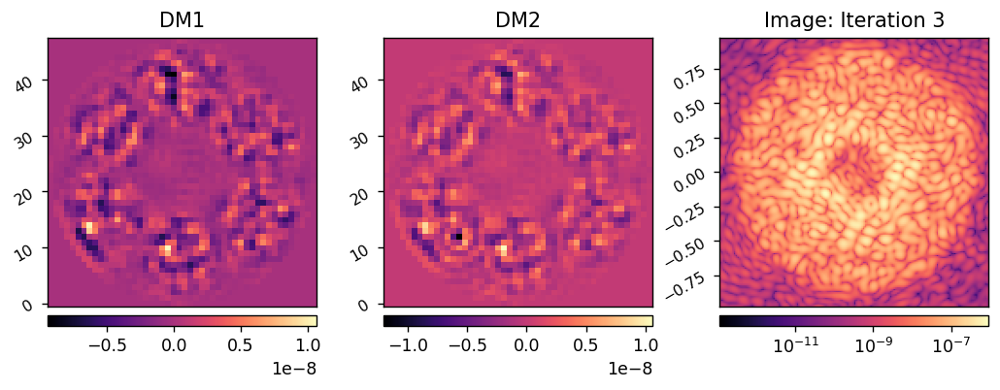

	Closed-loop iteration 4 / 50
(2504,)


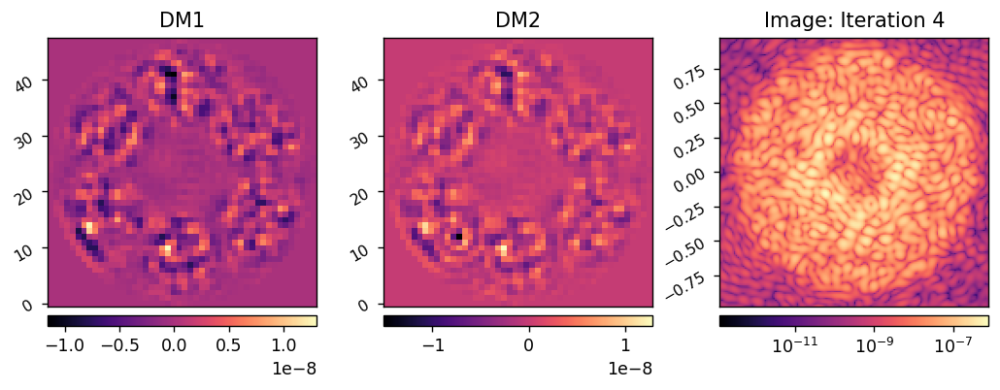

	Closed-loop iteration 5 / 50
(2504,)


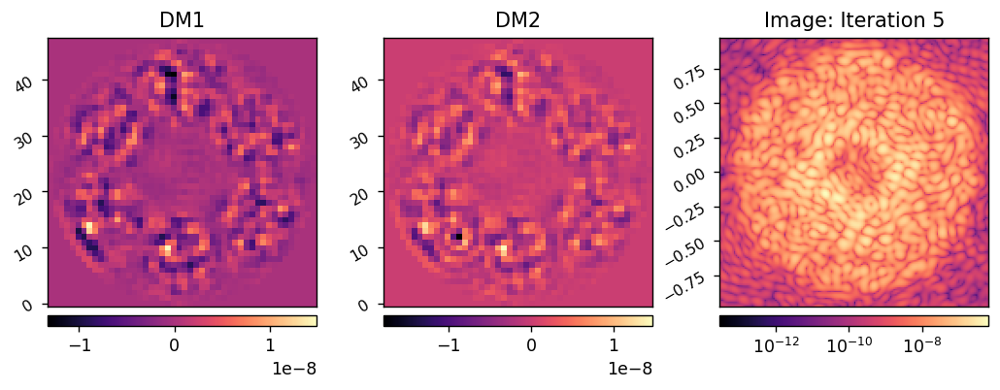

	Closed-loop iteration 6 / 50
(2504,)


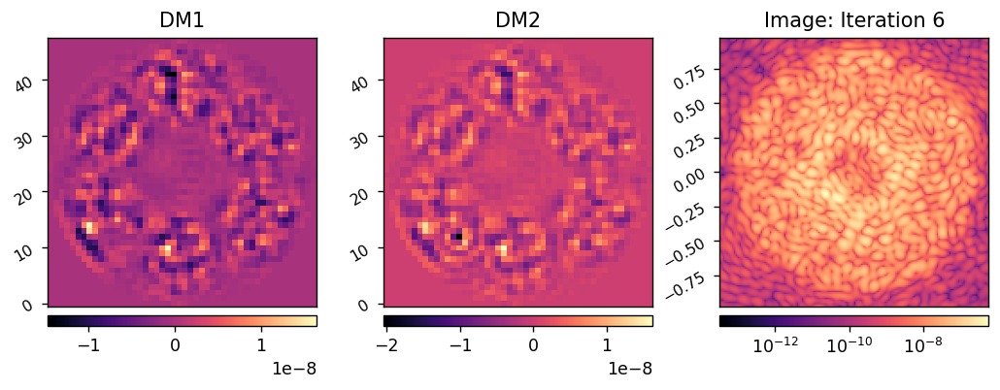

	Closed-loop iteration 7 / 50
(2504,)


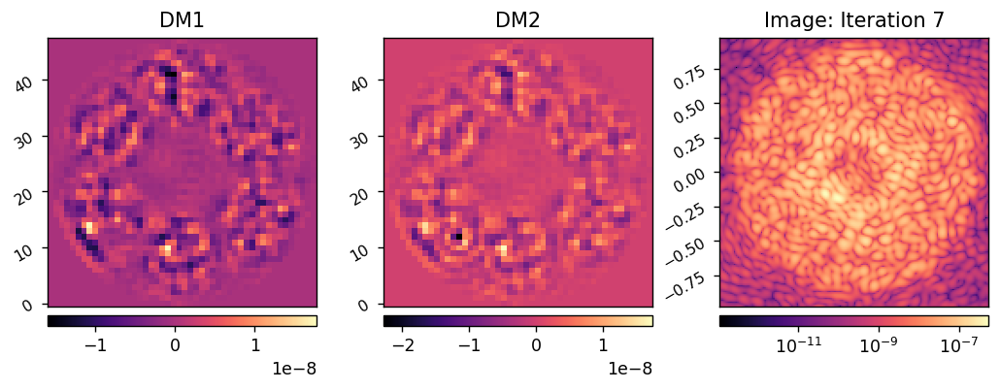

	Closed-loop iteration 8 / 50
(2504,)


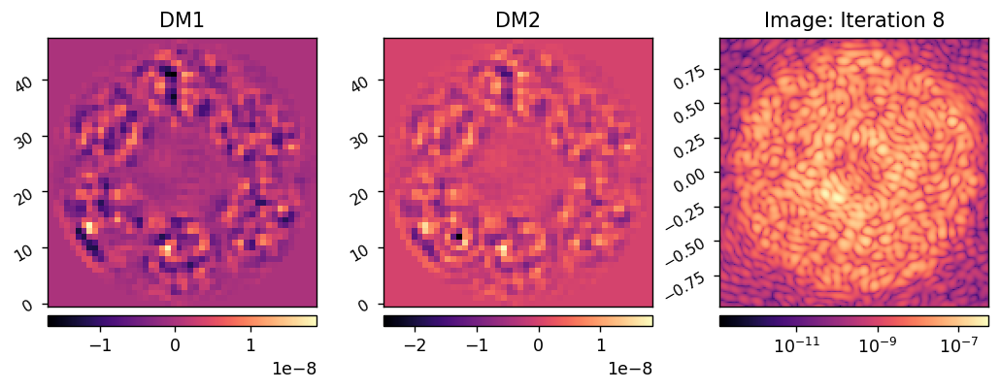

	Closed-loop iteration 9 / 50
(2504,)


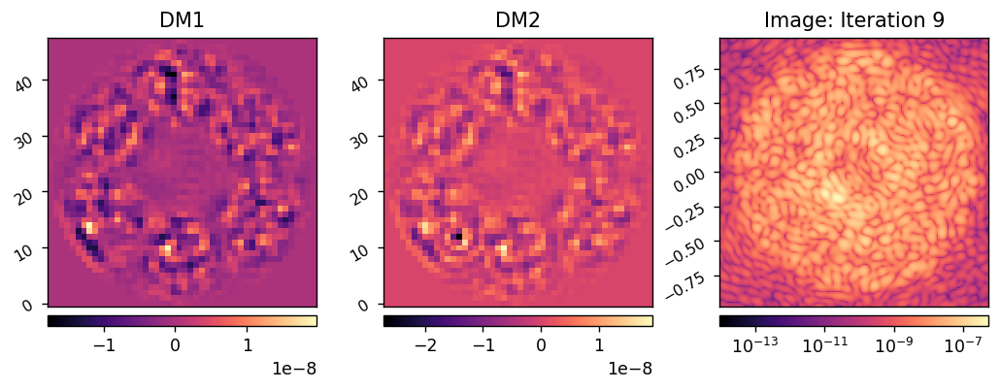

	Closed-loop iteration 10 / 50
(2504,)


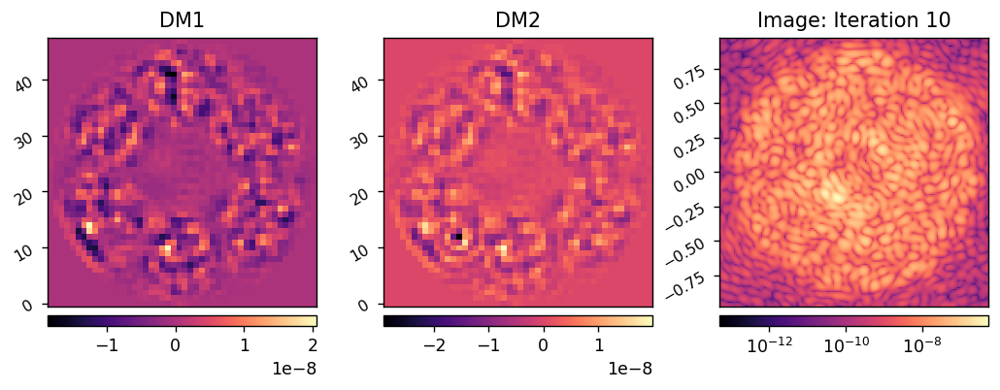

	Closed-loop iteration 11 / 50
(2504,)


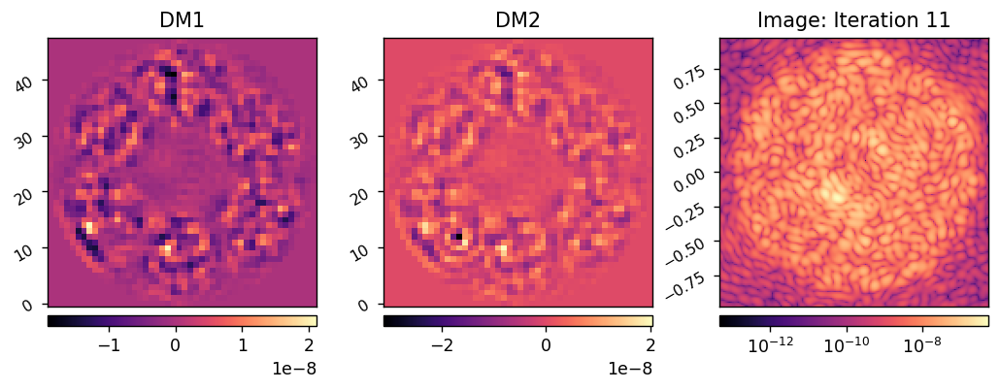

	Closed-loop iteration 12 / 50
(2504,)


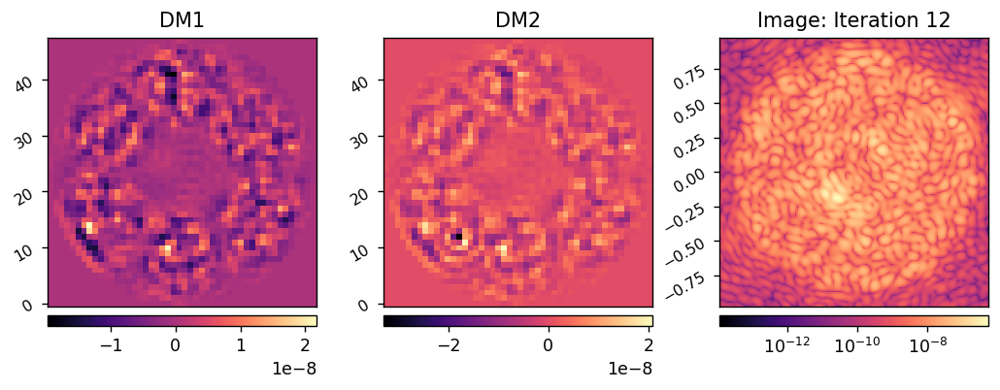

	Closed-loop iteration 13 / 50
(2504,)


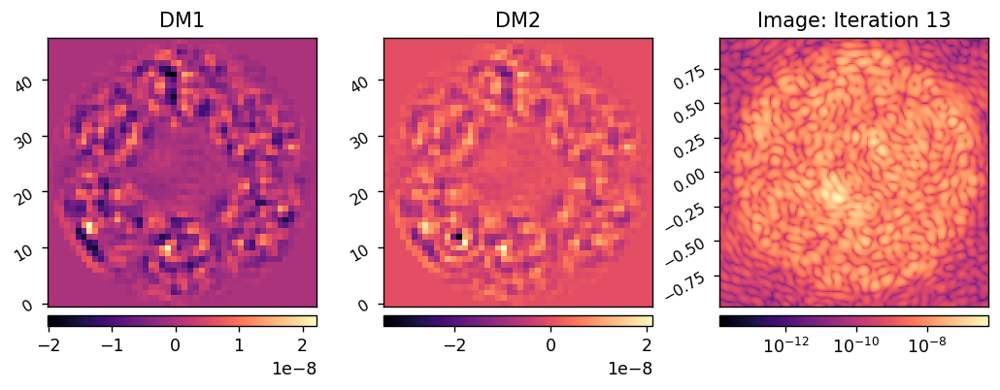

	Closed-loop iteration 14 / 50
(2504,)


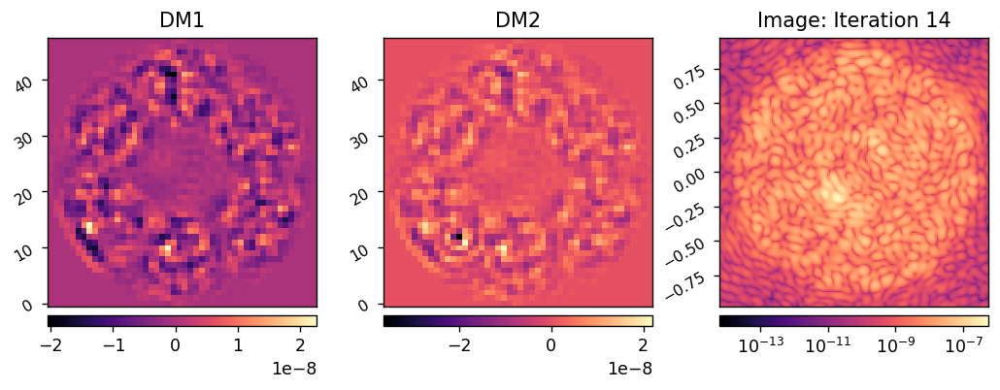

	Closed-loop iteration 15 / 50
(2504,)


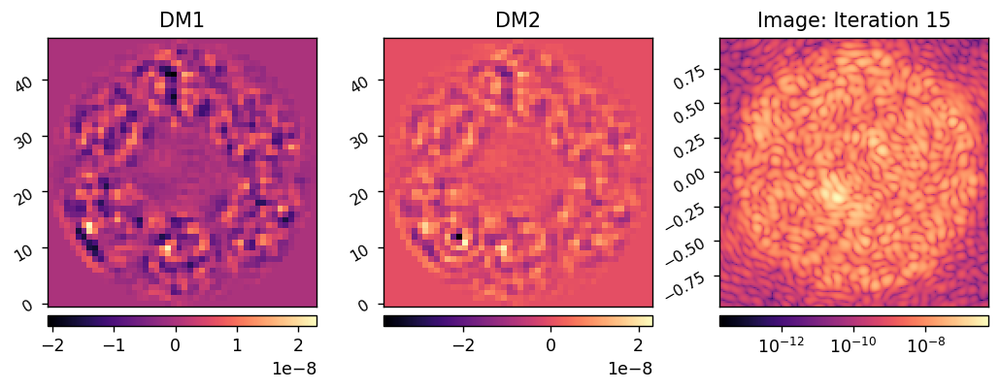

	Closed-loop iteration 16 / 50
	Computing EFC matrix via construct_control_matrix with condition values (0.01, 0.01)
Using Weighted Least Squares 
(2504,)


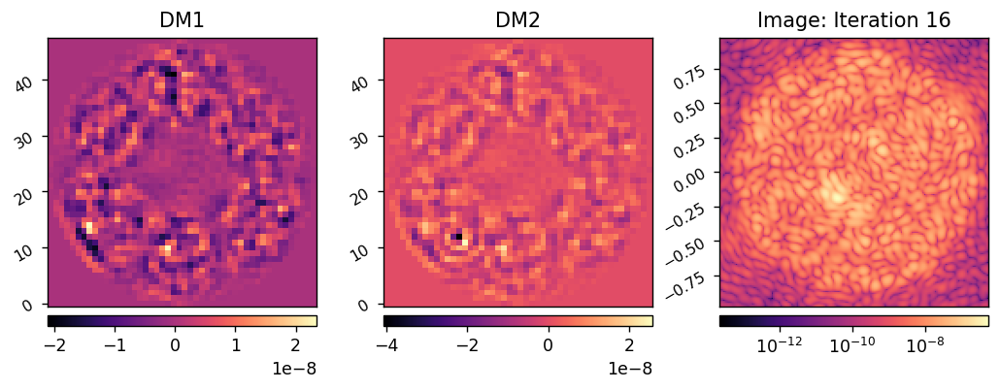

	Closed-loop iteration 17 / 50
(2504,)


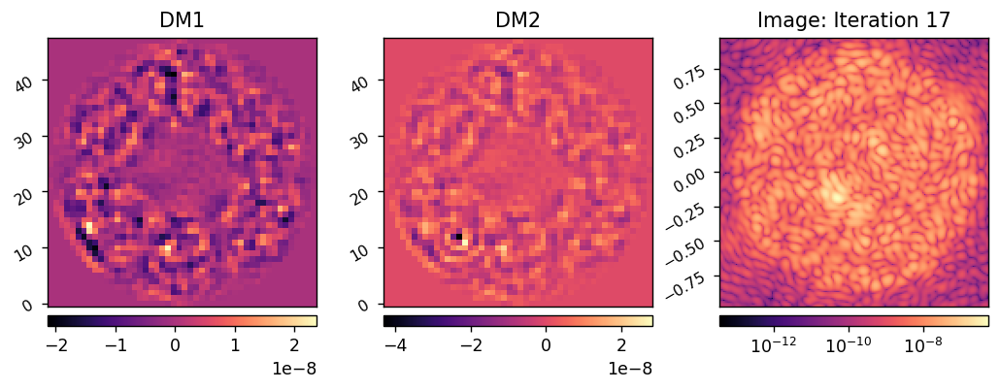

	Closed-loop iteration 18 / 50
(2504,)


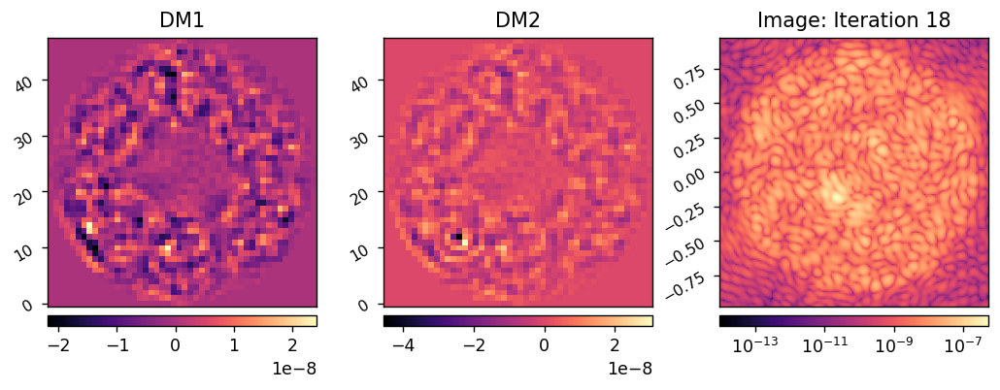

	Closed-loop iteration 19 / 50
(2504,)


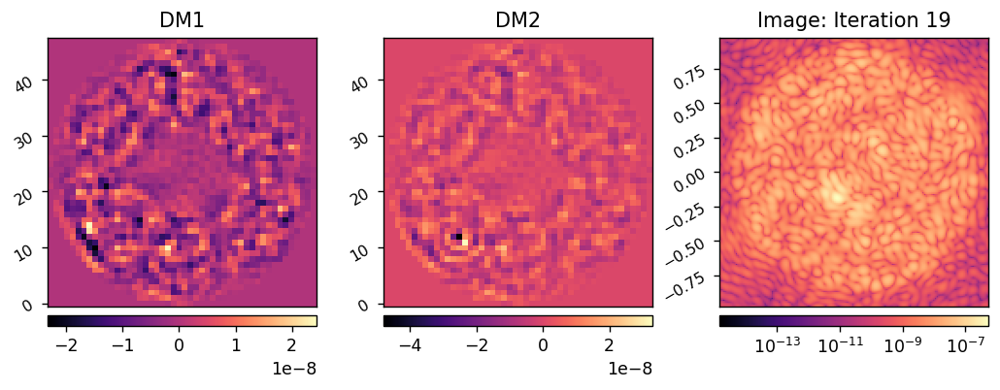

	Closed-loop iteration 20 / 50
(2504,)


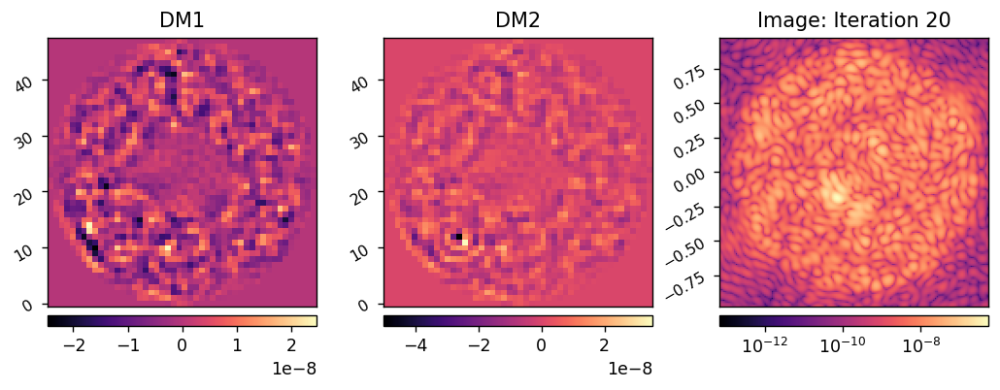

	Closed-loop iteration 21 / 50
	Computing EFC matrix via construct_control_matrix with condition values (0.1, 0.1)
Using Weighted Least Squares 
(2504,)


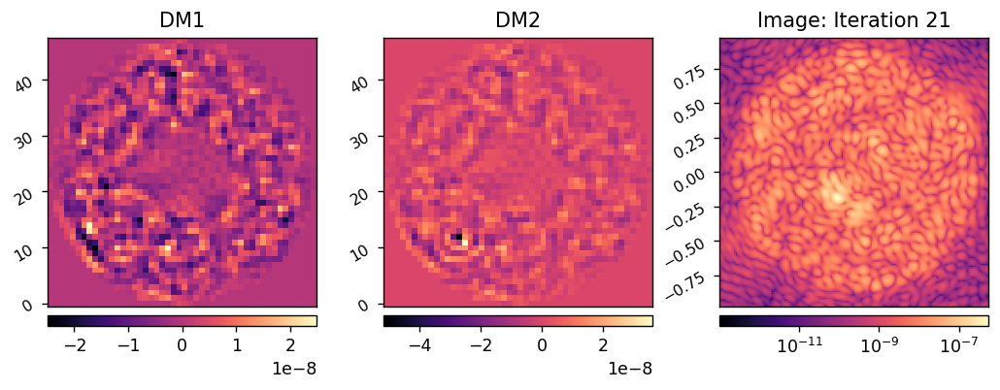

	Closed-loop iteration 22 / 50
(2504,)


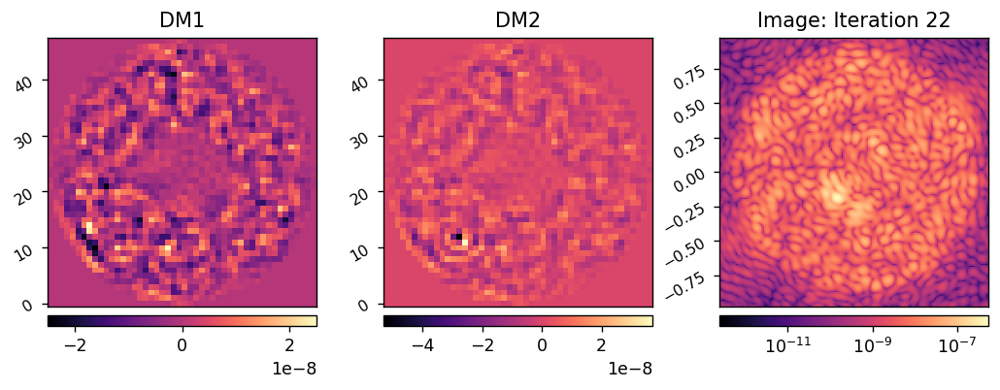

	Closed-loop iteration 23 / 50
(2504,)


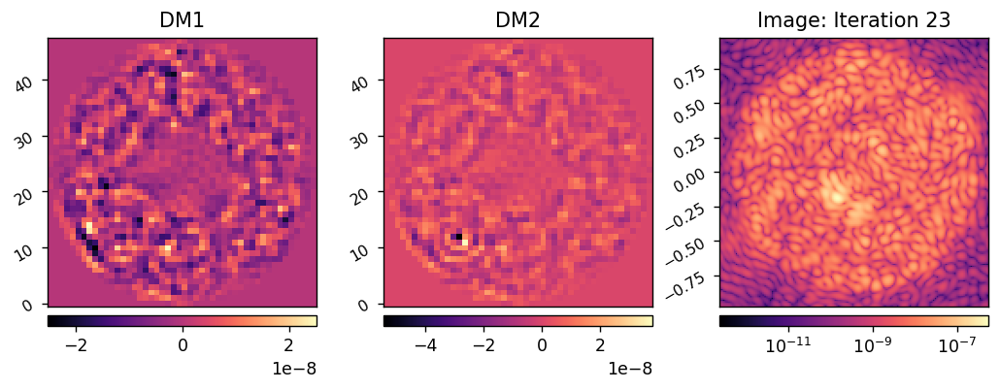

	Closed-loop iteration 24 / 50
(2504,)


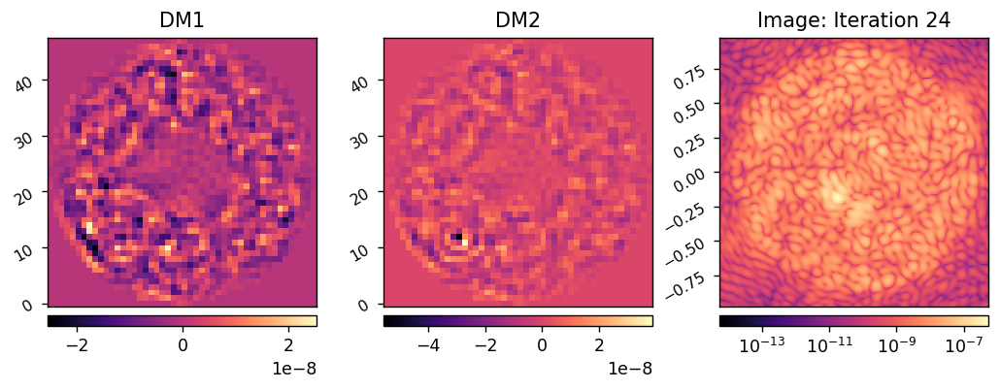

	Closed-loop iteration 25 / 50
(2504,)


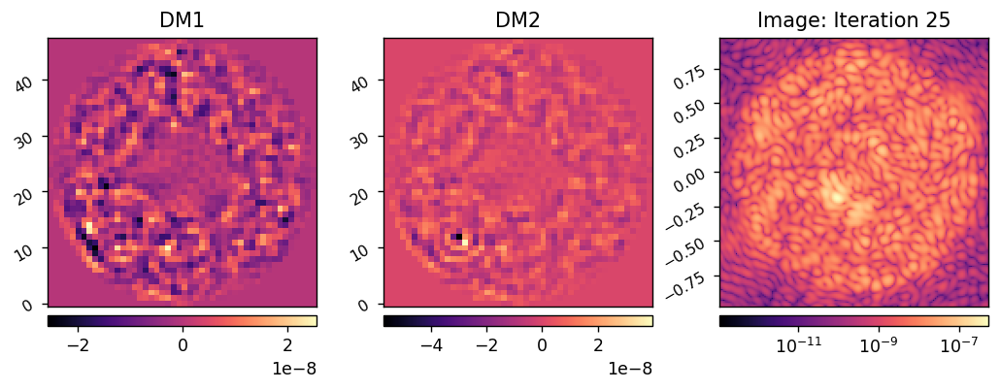

	Closed-loop iteration 26 / 50
(2504,)


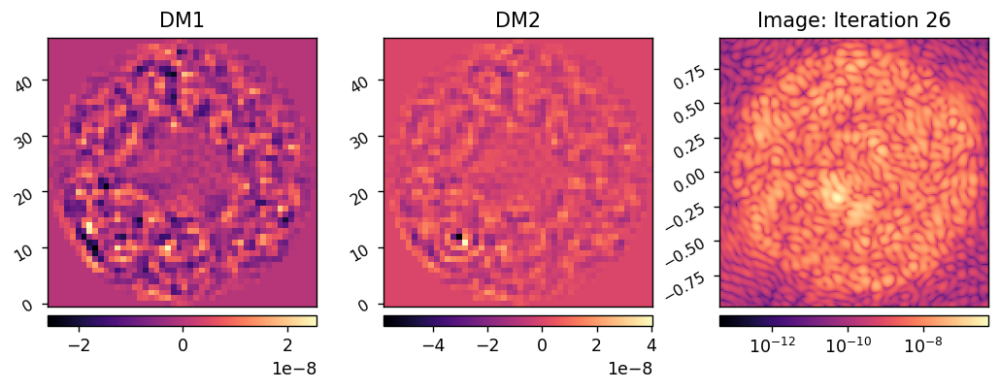

	Closed-loop iteration 27 / 50
(2504,)


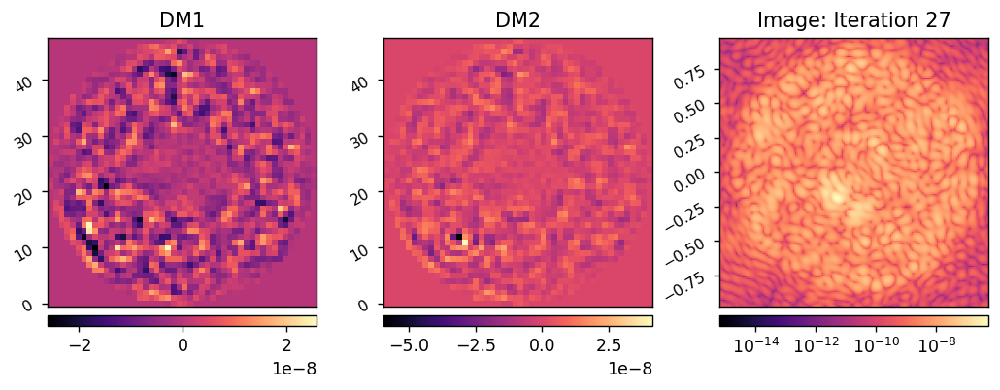

	Closed-loop iteration 28 / 50
(2504,)


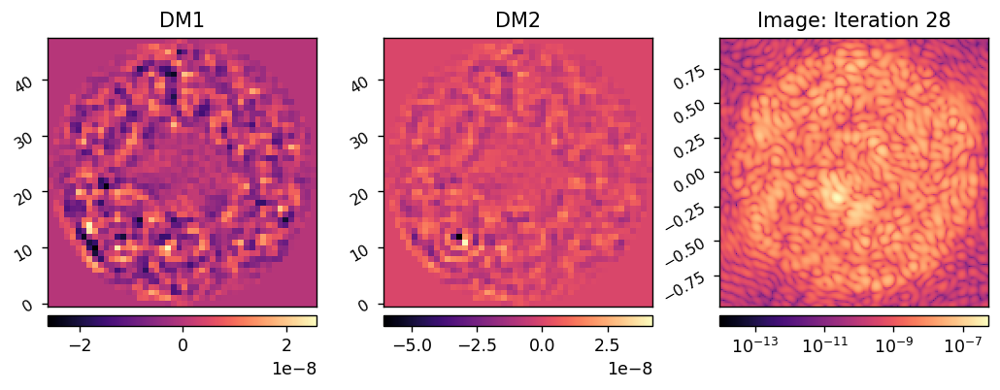

	Closed-loop iteration 29 / 50
(2504,)


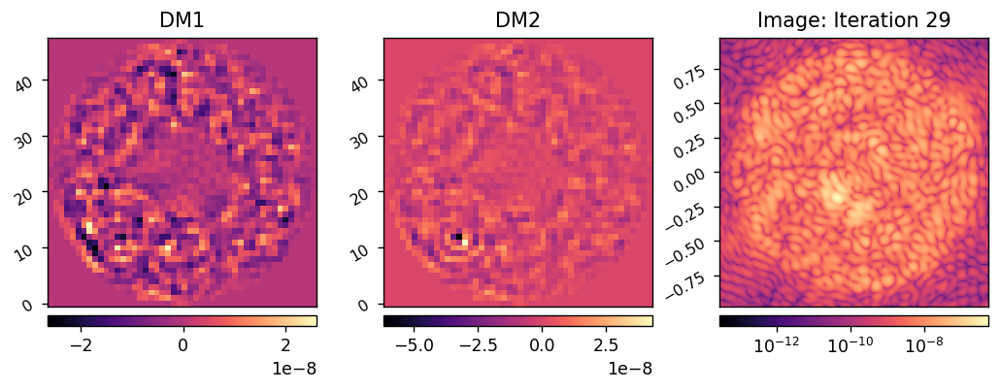

	Closed-loop iteration 30 / 50
(2504,)


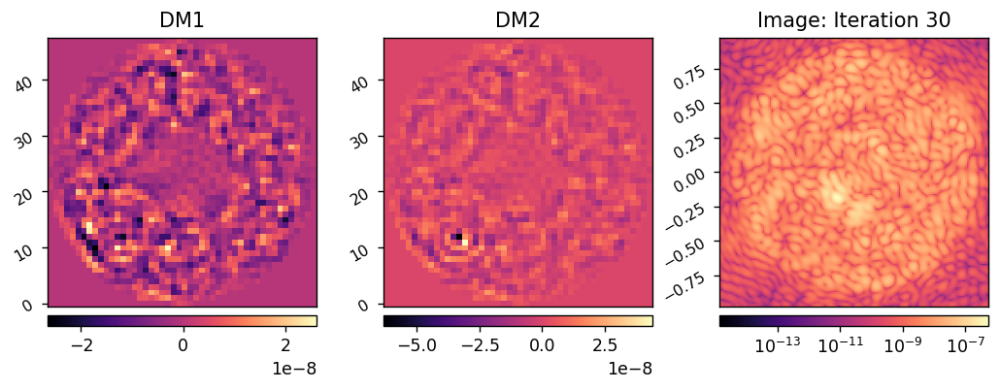

	Closed-loop iteration 31 / 50
	Computing EFC matrix via construct_control_matrix with condition values (0.01, 0.01)
Using Weighted Least Squares 
(2504,)


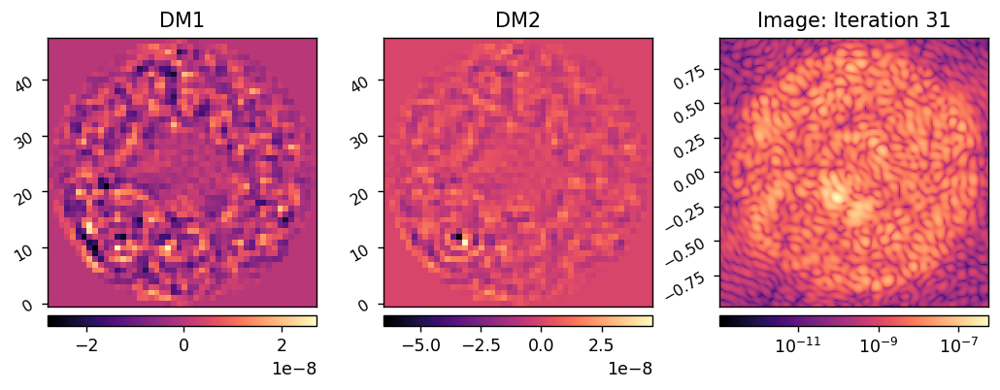

	Closed-loop iteration 32 / 50
(2504,)


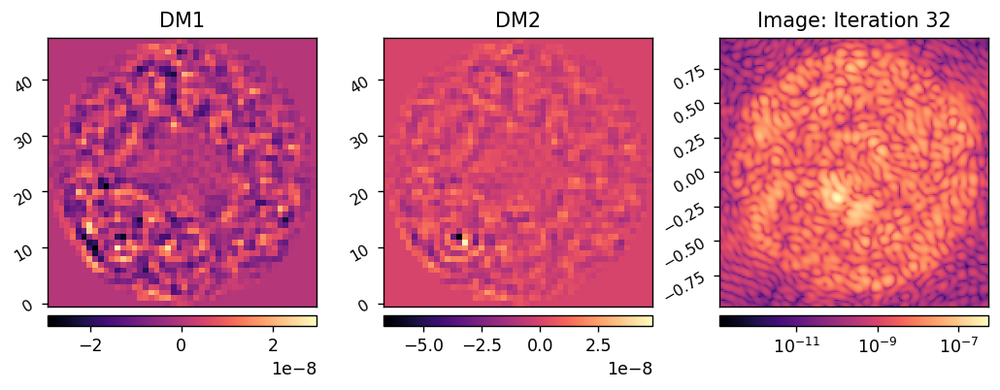

	Closed-loop iteration 33 / 50
(2504,)


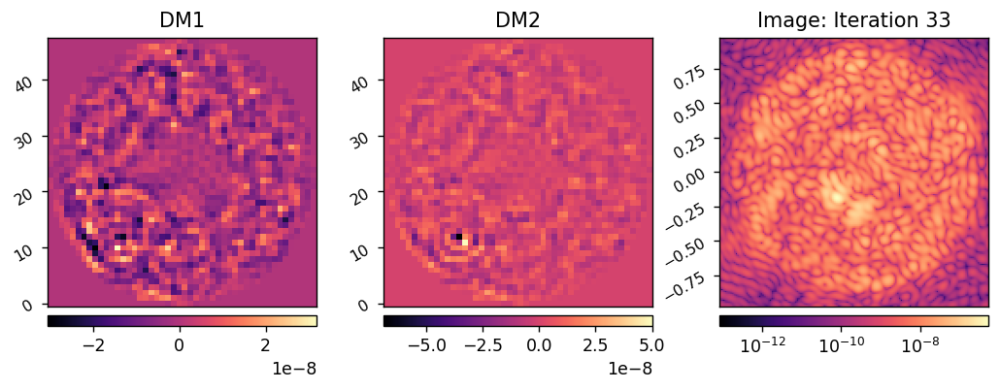

	Closed-loop iteration 34 / 50
(2504,)


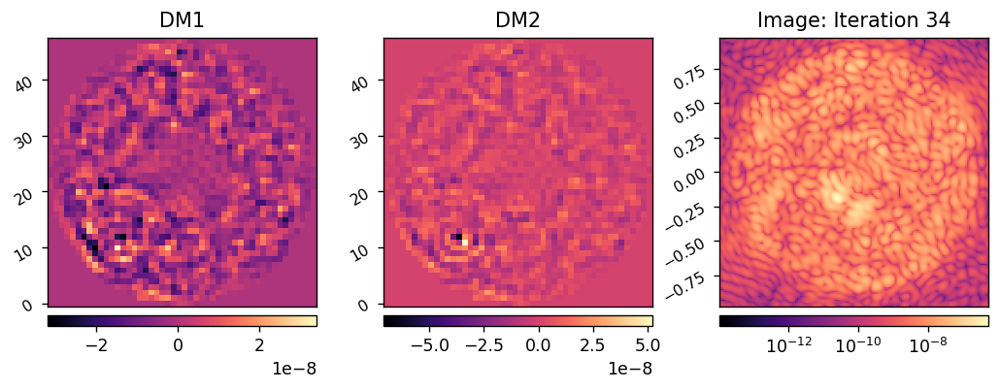

	Closed-loop iteration 35 / 50
(2504,)


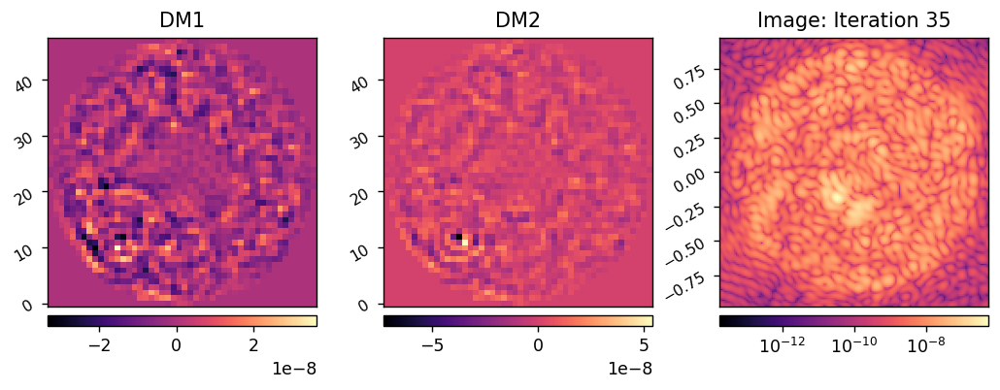

	Closed-loop iteration 36 / 50
	Computing EFC matrix via construct_control_matrix with condition values (0.1, 0.1)
Using Weighted Least Squares 
(2504,)


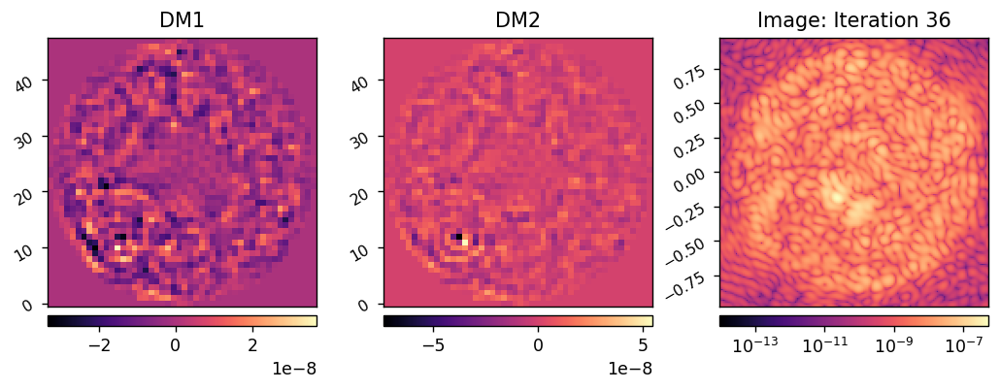

	Closed-loop iteration 37 / 50
(2504,)


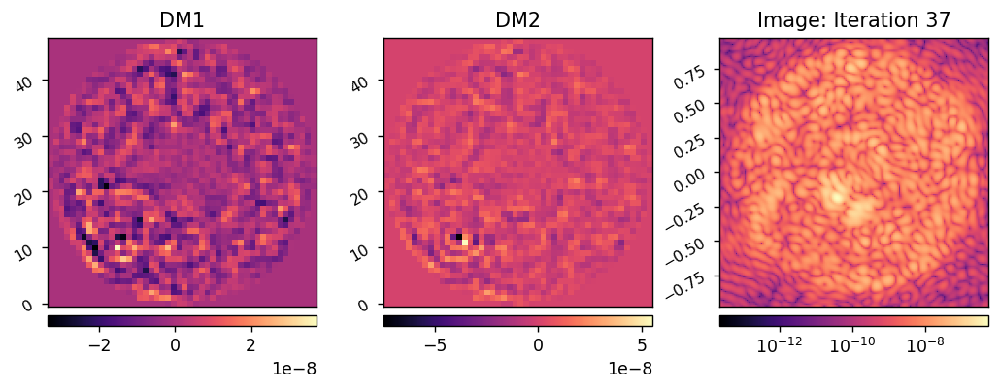

	Closed-loop iteration 38 / 50
(2504,)


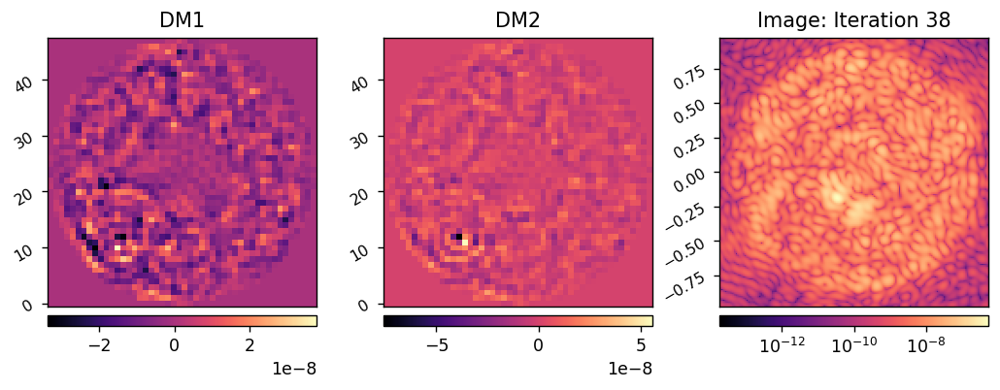

	Closed-loop iteration 39 / 50
(2504,)


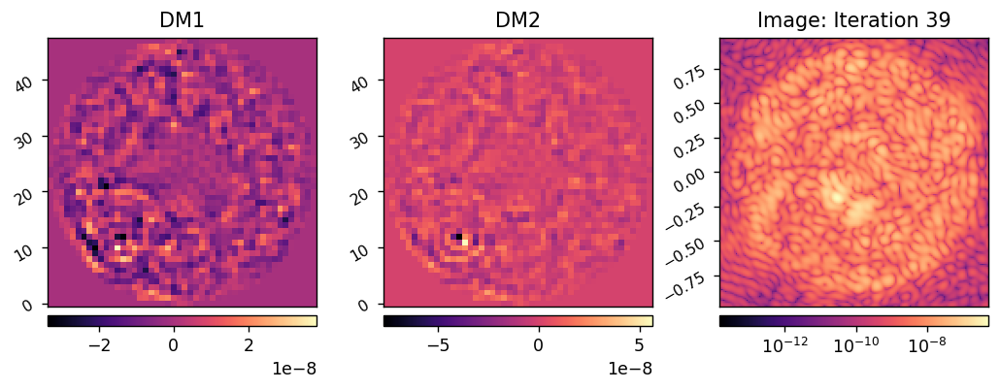

	Closed-loop iteration 40 / 50
(2504,)


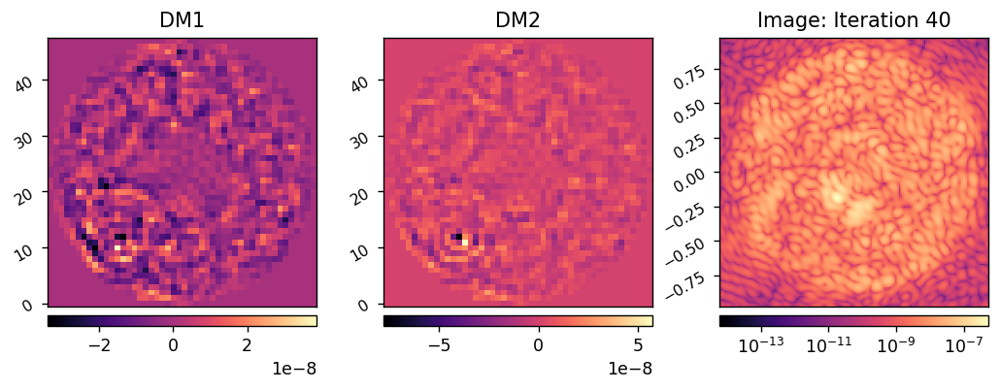

	Closed-loop iteration 41 / 50
(2504,)


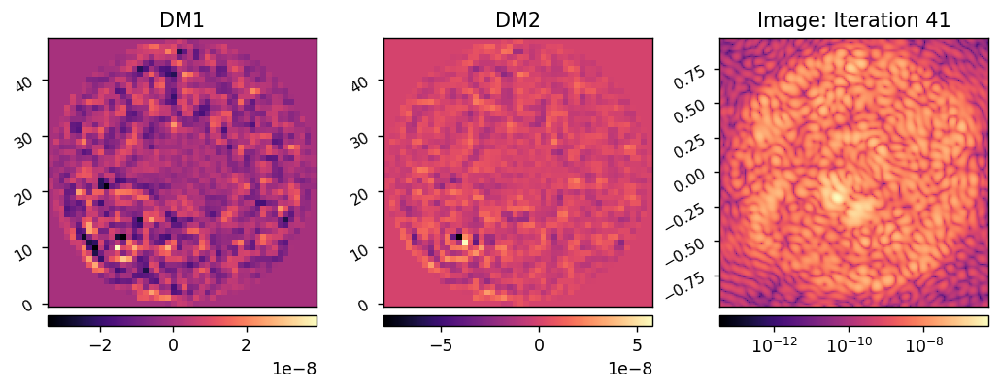

	Closed-loop iteration 42 / 50
(2504,)


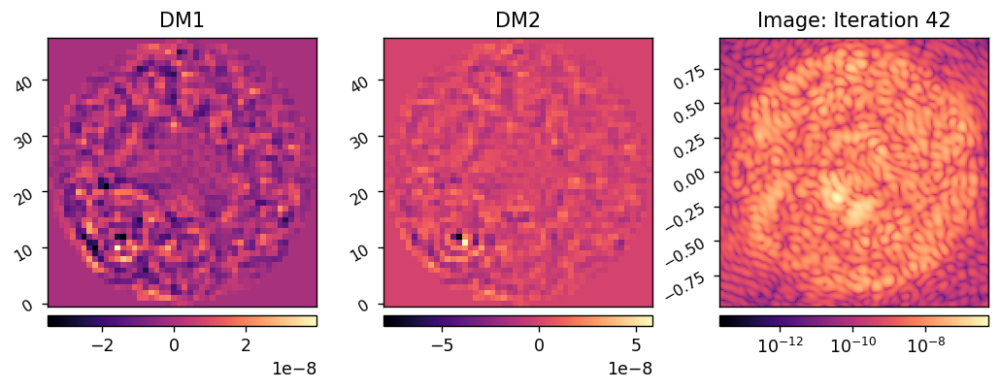

	Closed-loop iteration 43 / 50
(2504,)


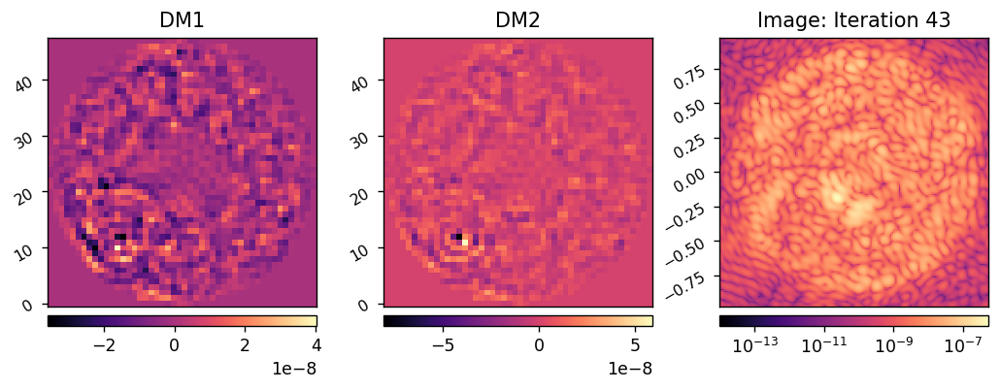

	Closed-loop iteration 44 / 50
(2504,)


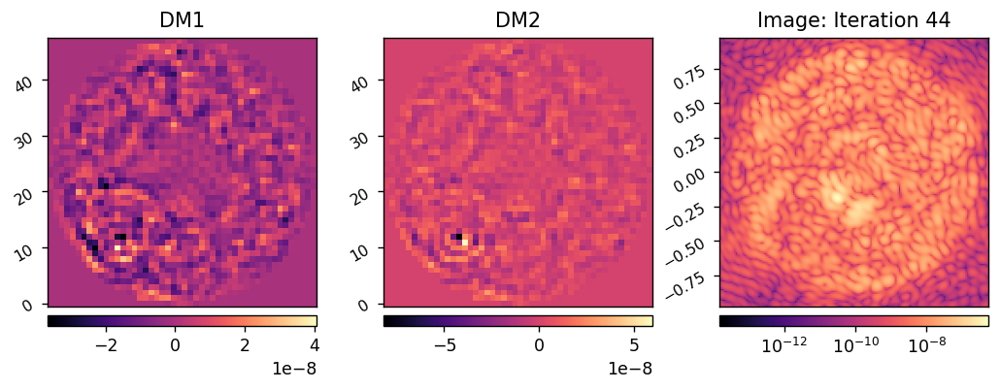

	Closed-loop iteration 45 / 50
(2504,)


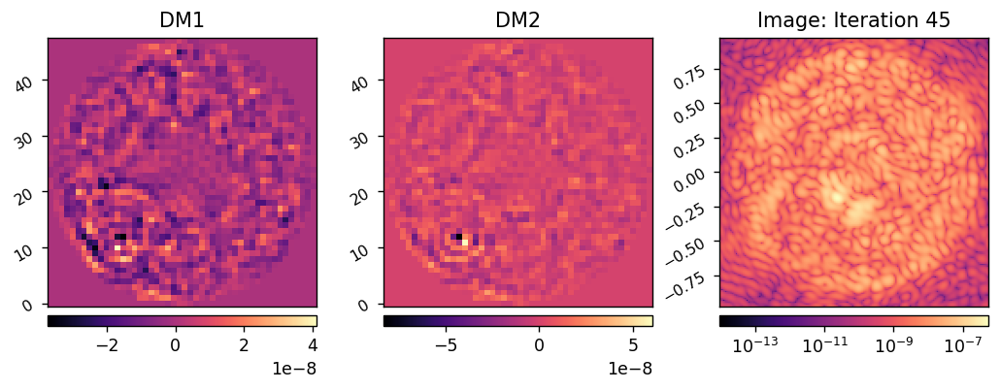

	Closed-loop iteration 46 / 50
(2504,)


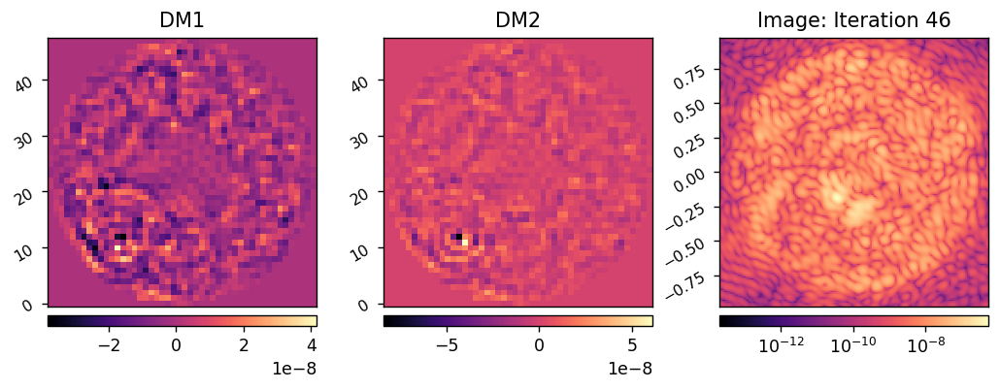

	Closed-loop iteration 47 / 50
(2504,)


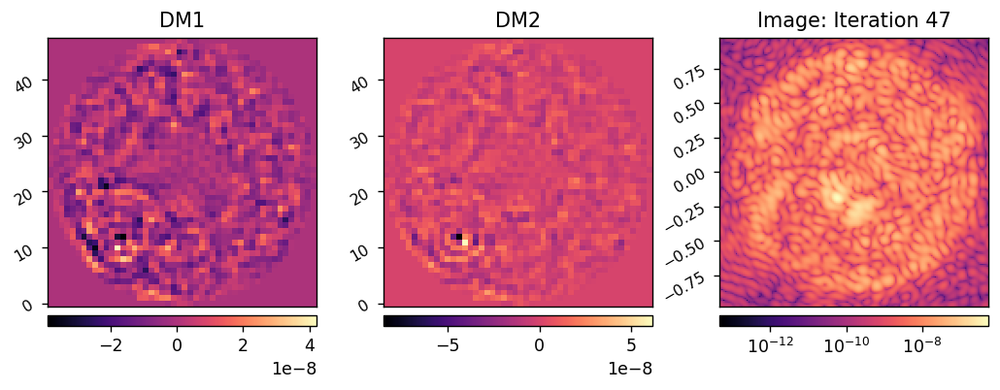

	Closed-loop iteration 48 / 50
(2504,)


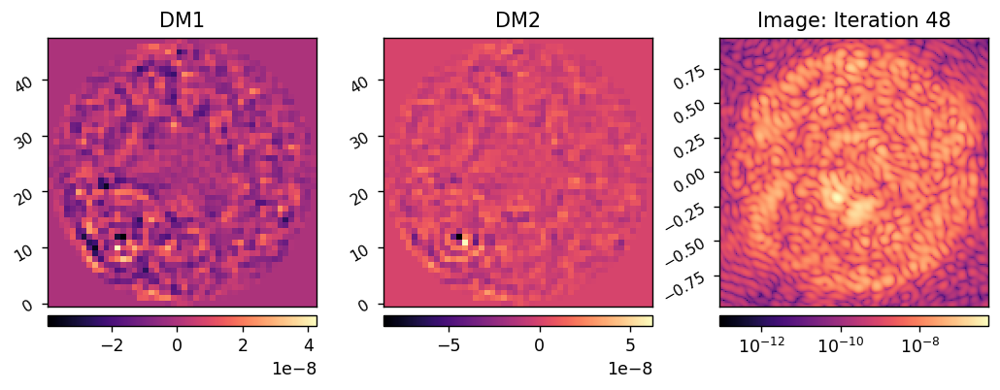

	Closed-loop iteration 49 / 50
(2504,)


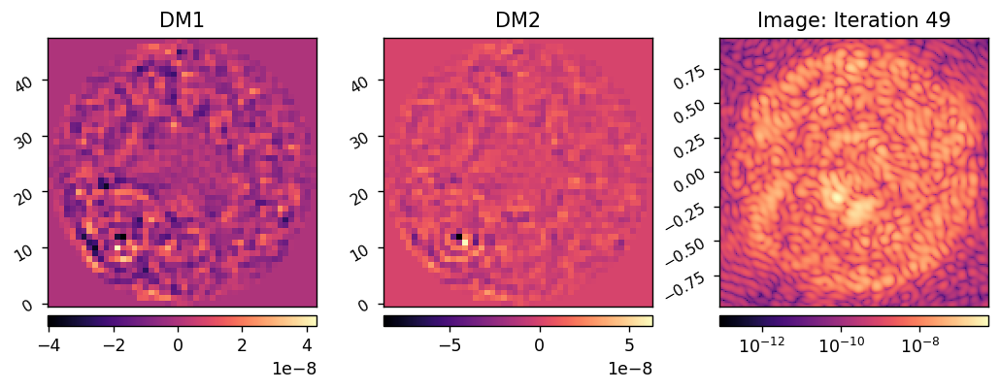

	Closed-loop iteration 50 / 50
(2504,)


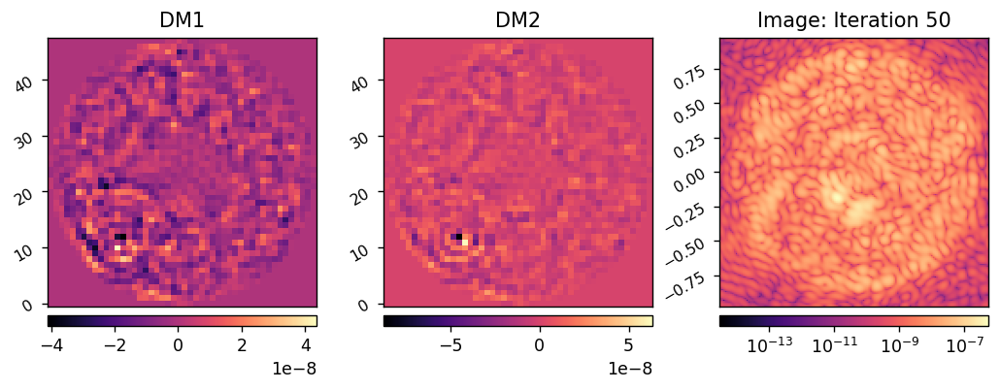

I-EFC loop completed in 792.702s.


In [19]:
reload(iefc)

sysi.reset_dms()

images, dm1_commands, dm2_commands = iefc.run(sysi, 
                                              reg_fun,reg_conds,
                                              response_cube, 
                                              probe_modes, 
                                              probe_amp, 
                                              calib_modes, 
                                              weight_map, 
                                              num_iterations=50, 
                                              loop_gain=0.1, leakage=0.0,
                                              display_all=True,
                                             )

In [163]:
iefcu.save_pickle(data_dir/'image-results'/fname, images)
iefcu.save_pickle(data_dir/'dm-results'/fname, dm_commands)

Saved wavefronts to:  /groups/douglase/kians-data-files/roman-cgi-iefc-data/image-results/dshaped_Yopds_polaxis0_iwa3.0_owa6.0
Saved wavefronts to:  /groups/douglase/kians-data-files/roman-cgi-iefc-data/dm-results/dshaped_Yopds_polaxis0_iwa3.0_owa6.0
